# Pratical session on Image Retrieval

In this practical session, we will explore how to perform typical tasks associated with image retrieval. Students will be able to download this IPython/Jupyter notebook after the class in order to perform the experiments also at home. 

**Link to the slides**: [PDF](https://www.dropbox.com/s/i79w8vbkgmvacof/25_02_MVA_practical_session.pdf?dl=0)

## Step 1: Create a new copy of this notebook

In order to follow this tutorial, please create a new copy of this notebook and name your copy using your own name. **Do not run this notebook directly, as it is read-only for students and any changes will not be able to be saved.** To start following this tutorial:


1. Click File -> Make a Copy
1. Wait for the new tab to open
1. Click on the name of the notebook (probably Tutorial-CopyN) and rename it to 'Tutorial-yourname.lastname'.
1. Close the previous tab containing this notebook (in order to avoid any mistakes when following the tutorial)
1. Resume reading this tutorial from this point forward

## Step 2: Basics for executing a Jupyter Notebook:

In order to run a cell, select a cell and press **'shift + enter'**

## Step 3: Write us back the answers of the questions below

During the execution of this notebook, you will find some questions that need to be answered. Please write your answers in a separate text file and send us by e-mail at rafael.sampaio-de-rezende@naverlabs.com
 If you work together with other people during the practical session, you can send a single answer file for two or three people.

# Preparatives

We start by importing the necessary modules and fixing a random seed. Please select the cell below and press **'shift+enter'**:

In [1]:
import numpy as np
from numpy.linalg import norm
import torch
from torch import nn
import json
import pdb
import sys
import os.path as osp
import pandas as pd
from PIL import Image
import sys   
import warnings

from datasets import create
from archs import *
from utils.test import extract_query
from utils.tsne import do_tsne

np.random.seed(0)

print('Ready!')

Ready!


Now, let's start by instantiating the Oxford dataset, that we will use in all following experiments.

In [2]:
# create Oxford 5k database
dataset = create('Oxford')

We can now query for some aspects of this dataset, such as the number of images, number of classes, the name of the different classes, and the class label for each of the images in the dataset:

In [3]:
print('Dataset: ' + dataset.dataset_name)
print()

labels = dataset.get_label_vector()
classes = dataset.get_label_names()

print('Number of images:  ' + str(labels.shape[0]))
print('Number of classes: ' + str(classes.shape[0]))
print()
print('Class names: ' + str(classes))

Dataset: Oxford

Number of images:  5063
Number of classes: 11

Class names: ['all_souls' 'ashmolean' 'balliol' 'bodleian' 'christ_church' 'cornmarket'
 'hertford' 'keble' 'magdalen' 'pitt_rivers' 'radcliffe_camera']


Now, let's load a list of models we can use in this tutorial:

In [4]:
# load the dictionary of the available models and features
with open('data/models.json', 'r') as fp:
    models_dict = json.load(fp)

pd.DataFrame(models_dict).T # show the loaded models onscreen

,dataset,queries,training,weights
alexnet-cls-imagenet-fc7,data/features/alexnet-cls-imagenet-fc7_ox.npy,data/features/alexnet-cls-imagenet-fc7_oxq.npy,NaN,NaN
alexnet-cls-lm-fc7,data/features/alexnet-cls-lm-fc7_ox.npy,data/features/alexnet-cls-lm-fc7_oxq.npy,NaN,NaN
alexnet-cls-lm-gem,data/features/alexnet-cls-lm_ox.npy,data/features/alexnet-cls-lm_oxq.npy,NaN,NaN
resnet18-cls-imagenet-gem,data/features/resnet18-cls-imagenet_ox.npy,data/features/resnet18-cls-imagenet_oxq.npy,NaN,NaN
resnet18-cls-lm-gem,data/features/resnet18-cls-lm_ox.npy,data/features/resnet18-cls-lm_oxq.npy,NaN,NaN
resnet18-cls-imagenet-gem-pcaw,data/features/resnet18-cls-imagenet-pca_ox.npy,data/features/resnet18-cls-imagenet-pca_oxq.npy,NaN,NaN
resnet18-cls-lm-gem-pcaw,data/features/resnet18-cls-lm-pca_ox.npy,data/features/resnet18-cls-lm-pca_oxq.npy,NaN,NaN
resnet18-rnk-lm-gem,data/features/resnet18-rnk-lm_ox.npy,data/features/resnet18-rnk-lm_oxq.npy,NaN,NaN
resnet18-rnk-lm-gem-da,data/features/resnet18-rnk-lm-da_ox.npy,data/features/resnet18-rnk-lm-da_oxq.npy,NaN,data/models/resnet18-rnk-lm-da.pt
resnet18-rnk-lm-gem-da-mr,data/features/resnet18-rnk-lm-da_mr_ox.npy,data/features/resnet18-rnk-lm-da_mr_oxq.npy,NaN,data/models/resnet18-rnk-lm-da.pt


# Part 1: Training

In this first part of the tutorial, we will study how different changes in the training pipeline (e.g. choice of model, pooling, and post-processing options) can change the quality of results we obtain.

## a) Creating a network with the AlexNet architecture

As a first step, we will be creating a neural network implementing the AlexNet architecture to use in our experiments.

In [5]:
# instantate the model for the first experiment
model_1a = alexnet_imagenet()

# show the network details
print(model_1a)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

Now, we could use this model to extract features for all images in our dataset. In order to make this faster, we have already precomputed those features and stored them in the disk.

In order to load the features computed by this model from the disk, run the cell below:

In [6]:
dfeats = np.load(models_dict['alexnet-cls-imagenet-fc7']['dataset'])

In [7]:
pd.DataFrame(dfeats)

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,-0.035850,-0.027481,-0.002729,-0.001876,0.000510,-0.026890,-0.031041,0.008593,-0.036306,-0.011108,...,-0.000412,-0.031039,-0.011067,-0.017820,-0.013743,0.002906,-0.013534,-0.010850,-0.007984,-0.009079
1,-0.019589,-0.024991,0.003753,-0.016643,-0.001419,-0.025324,-0.030376,-0.015020,-0.033136,-0.008341,...,-0.011891,-0.025685,-0.012602,-0.019166,-0.008587,-0.010230,-0.015686,-0.003145,-0.027240,-0.005164
2,-0.031182,-0.015624,0.003333,-0.010716,-0.000947,-0.037874,-0.024973,-0.022489,-0.024565,-0.005231,...,-0.004073,-0.022185,-0.011347,-0.011516,-0.016464,-0.009736,-0.011495,-0.011072,-0.034790,-0.005476
3,-0.018782,-0.022565,0.002240,-0.010076,-0.001437,-0.020373,-0.020782,-0.029803,-0.025968,-0.005636,...,-0.002036,-0.015342,-0.007680,-0.017931,-0.013359,-0.027249,-0.012993,0.000823,-0.041952,0.002931
4,-0.016079,-0.034830,-0.011318,-0.011594,-0.001433,-0.015717,-0.019140,-0.014942,-0.027230,-0.001502,...,-0.008466,-0.026986,-0.014449,-0.024464,-0.024707,-0.029167,-0.015347,-0.011359,-0.034020,-0.010275
5,-0.027226,-0.019598,0.002683,-0.018460,-0.002139,-0.034594,-0.020992,-0.021336,-0.028204,-0.004704,...,-0.004012,-0.021141,-0.012326,-0.013401,-0.012377,-0.015479,-0.010811,-0.012446,-0.042647,-0.002835
6,-0.020550,-0.007709,-0.000061,-0.010187,-0.000725,-0.028299,-0.022015,-0.020881,-0.003965,0.002100,...,-0.007808,-0.027547,-0.007727,-0.017005,-0.013676,-0.014634,-0.014620,-0.006139,-0.039100,-0.000403
7,-0.025968,-0.023937,0.003283,-0.019003,-0.001922,-0.033658,-0.013863,-0.016475,-0.026929,-0.005424,...,-0.005924,-0.025334,-0.012016,-0.018541,-0.009853,-0.015122,-0.012085,-0.008246,-0.040714,-0.006721
8,-0.028738,-0.019763,0.004495,-0.010969,-0.001037,-0.035472,-0.024952,-0.001374,-0.019975,-0.005449,...,-0.004924,-0.013961,-0.010573,-0.020533,-0.017181,-0.007581,-0.009856,-0.000078,-0.032787,0.006912
9,-0.038494,0.011658,-0.000689,-0.011762,0.001312,-0.029404,-0.032518,-0.013561,0.012424,0.003670,...,-0.016833,-0.005571,-0.015611,-0.017843,-0.023685,-0.013018,-0.014558,-0.006085,0.001898,0.006085


**Question 1**: What does each row of the matrix feats represent?
The row of the matrix feats represent the fc7 features (from the AlexNet Architecture) for every image in the dataset. The size of this feature vector is 4096.

**Question 2**: Where does the dimension of these lines comes from and how do we extract these features?
The AlexNet architecture is designed in such a way that the output of fc7 is a 4096 length vector.


_Hint: if you do not know the answers for the questions above, try running the following command:_
```
model_1a_test = alexnet_imagenet_fc7(); print(model_1a_test)
```

In [8]:
model_1a_test = alexnet_imagenet_fc7(); print(model_1a_test)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

Now, assuming that we have already used our network to extract features from all images in the dataset and stored them in the matrix *dfeats* (as done above), we will retrieve the top-15 images that are most similar to a query image. In our example, we will use the following image as a query:

In [9]:
q_idx = 11 # feel free to switch to another number afterwards, but test first with 11

AP=12.73


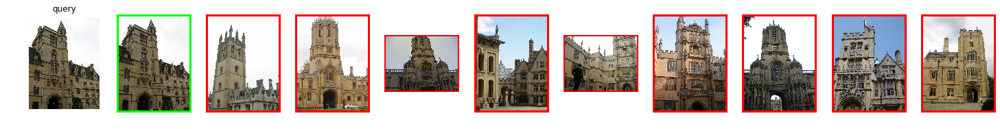

In [10]:
# visualize top results for a given query
dataset.vis_top(dfeats, q_idx, ap_flag=True)

To the right of the query image, we plot the best retrieval results, with decreasing similarity from left to right. Images in green frames are **true matches**, red frames are **false matches**, and gray frames are so-called **'junk' matches** (images from the same landmark, but from angles too different or at wrong spots). Junk matches are ignored during the calculation of the AP.

Now we will use the t-SNE algorithm to cluster images together according to feature similarity:

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.031s...
[t-SNE] Computed neighbors for 5063 samples in 10.034s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.162765
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.701149
[t-SNE] KL divergence after 300 iterations: 2.383235
t-SNE done! Time elapsed: 22.223 seconds


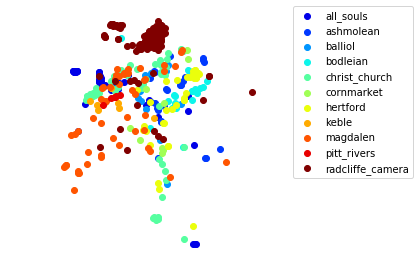

2-dimensional t-sne plot.


In [11]:
do_tsne(dfeats, labels, classes, sec='1a')

**Question 3**: What can be observe from the t-SNE visualization? Which classes 'cluster' well? Which do not?

radcliffe_camera class cluster reasonably well with few outliers. Whereas every other class fail to cluster.

## b) Finetuning the created network on the Landmarks dataset

Now, we will see what happens when we fine-tune our off-the-shelf ImageNet network in the Landmarks dataset and then repeat the process above. 

We can quickly compare some exemples of images of both training datasets.

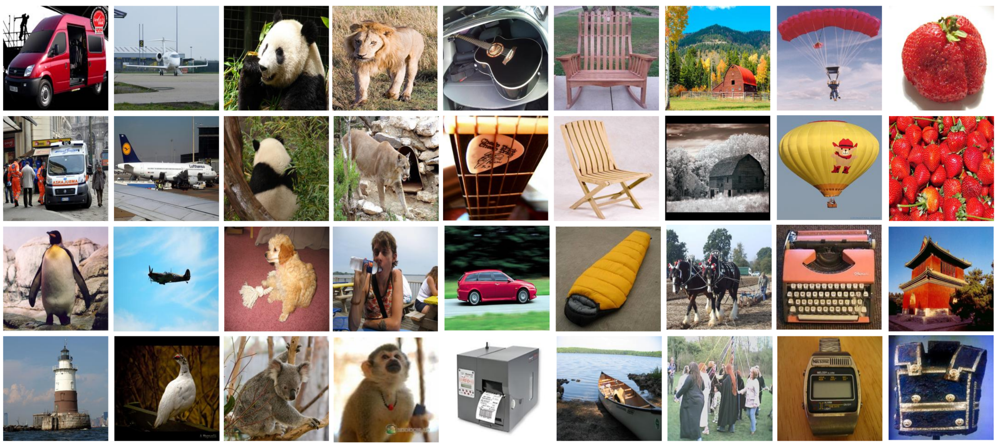

In [12]:
Image.open('figs/imagenet_ex.png')

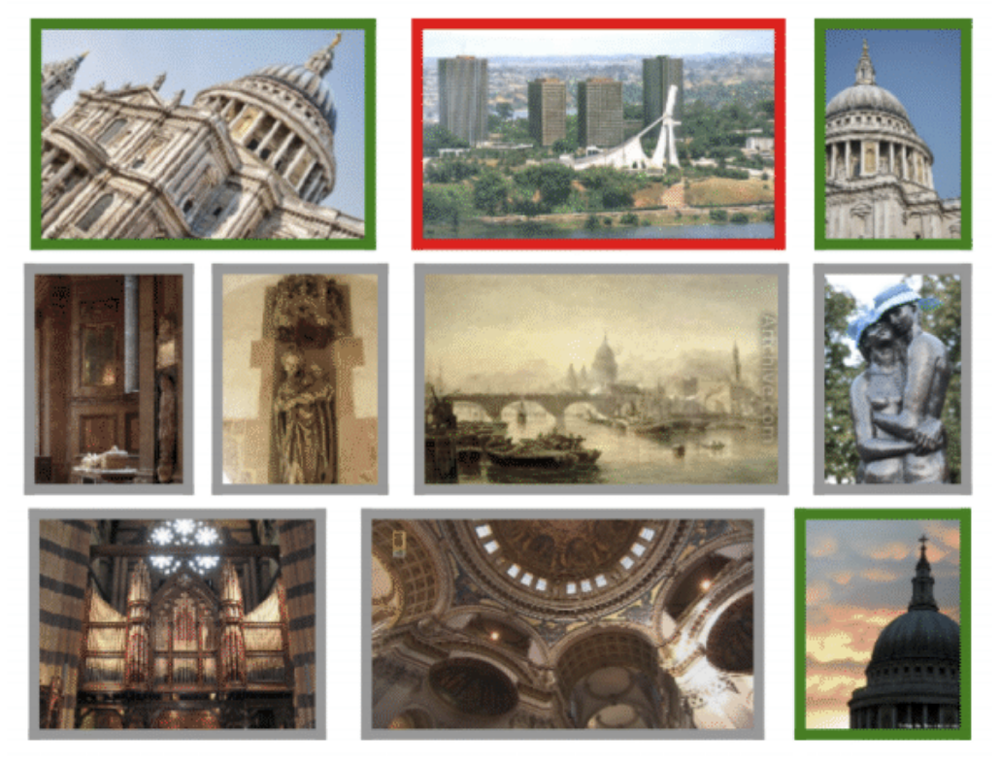

In [13]:
Image.open('figs/lm_ex.png')

**Question 4**: Should we get better results? What should change? Why?

In [14]:
model_1b = alexnet_lm() # instantate the model that has been fine-tuned in landmarks

print(model_1b) # show the network details

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

**Compare with the model we had before:**

In [15]:
print(model_1a)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

**Question 5**: Why do we change the last layer of the AlexNet architecture?  
The last layer needs to be changed because in model_1a is trained on ImageNet dataset with 1000 classes whereas model_1b will be finetuned on Oxford dataset with 586 classes.


**Question 6**: How do we initialize the layers of model_1b for finetuning?  
For early layers (dealing with local features) of model_1b we can keep the same weights in model_1a and for deeper layers, we can perform xavier initialization.

Let's now repeat the same process we had done before, but now using image features that have been extracted using the fine-tuned network.

In [16]:
dfeats = np.load(models_dict['alexnet-cls-lm-fc7']['dataset'])
pd.DataFrame(dfeats)

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,-0.028551,-0.026623,-0.010203,-0.010896,0.001626,-0.025944,-0.020717,0.011002,-0.045042,-0.010722,...,0.003847,-0.028382,-0.011679,-0.015839,-0.017878,0.002055,-0.012127,-0.008400,0.000425,-0.017276
1,-0.018635,-0.012787,-0.004841,-0.023212,-0.001751,-0.024415,-0.032008,-0.008180,-0.030614,-0.007919,...,0.001333,-0.027415,-0.014296,-0.016405,-0.014020,-0.015200,-0.015713,-0.003962,-0.011068,-0.008547
2,-0.032243,-0.020034,0.004824,-0.005007,0.001027,-0.021642,-0.026012,-0.015621,-0.032444,-0.006335,...,-0.001029,-0.019675,-0.012103,-0.015862,-0.018569,-0.009880,-0.014367,-0.003542,-0.029109,-0.000369
3,-0.013617,-0.016270,0.001534,-0.014598,-0.001201,-0.019049,-0.020825,-0.022464,-0.020278,-0.002925,...,0.001838,-0.017435,-0.008794,-0.012514,-0.020492,-0.019942,-0.014706,0.003281,-0.045019,0.008413
4,-0.009342,-0.030747,-0.007650,-0.003674,-0.002459,-0.010953,-0.021755,-0.010861,-0.031161,0.001171,...,-0.010367,-0.023052,-0.015727,-0.018414,-0.020291,-0.031972,-0.019041,-0.008903,-0.031688,-0.010810
5,-0.029534,-0.016715,0.000056,-0.010092,0.000297,-0.022919,-0.028175,-0.015088,-0.038621,-0.005485,...,-0.006256,-0.016297,-0.013381,-0.013261,-0.011519,-0.013824,-0.010889,-0.005092,-0.038197,-0.002112
6,-0.017982,-0.005457,0.001470,-0.010093,0.000075,-0.019405,-0.028549,-0.014583,-0.007152,0.008021,...,-0.014570,-0.027468,-0.014251,-0.020437,-0.016302,-0.022584,-0.012315,-0.000965,-0.035350,0.007543
7,-0.021748,-0.017116,0.001957,-0.018670,-0.002048,-0.023776,-0.019693,-0.019385,-0.020138,0.000627,...,-0.011379,-0.028215,-0.016770,-0.019200,-0.013233,-0.017148,-0.015777,-0.008602,-0.034981,0.004236
8,-0.024694,-0.014167,0.006056,-0.014417,-0.000376,-0.015628,-0.021058,0.000901,-0.014985,-0.000961,...,-0.011121,-0.013275,-0.016904,-0.017208,-0.029457,-0.009145,-0.017290,0.009647,-0.025372,0.015104
9,-0.022311,0.019810,-0.007204,-0.024596,0.004135,-0.025079,-0.024800,-0.019038,0.002539,0.002821,...,-0.015700,-0.001785,-0.012003,-0.014416,-0.026256,-0.013071,-0.020733,-0.003333,-0.004687,0.004002


Visualize the top-15 most similar images:

AP=24.67


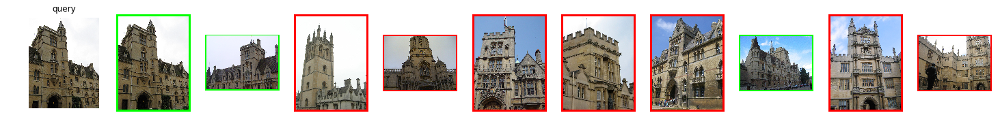

In [17]:
dataset.vis_top(dfeats, q_idx, ap_flag=True)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.055s...
[t-SNE] Computed neighbors for 5063 samples in 10.682s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.188440
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.426369
[t-SNE] KL divergence after 300 iterations: 2.448307
t-SNE done! Time elapsed: 23.646 seconds


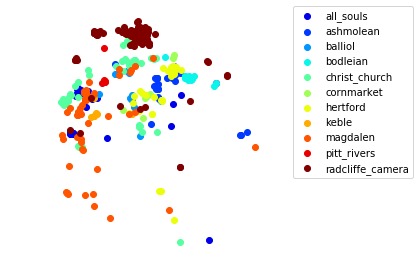

2-dimensional t-sne plot.


In [18]:
do_tsne(dfeats, labels, classes, sec='1b')

**Question 6**: How does the visualization change after finetuning? What about the top results?

**Question 7**: Why images need to be resized to 224x224 before they can be fed to AlexNet? How can this affect results?

## c) Replacing last max pooling layer with GeM layer

Now, we will replace the last max pooling layer of our network with a GeM layer and see how this affects the results. For this model, we remove all fully connected layers (classifier layers) and replace the last max pooling layer by an aggregation pooling layer (more details about this layer in the next subsection).

In [19]:
model_1c = alexnet_GeM() # instantate the fine-tuned model with a GeM layer instead of max-pooling

print(model_1c) # show the network details. Can you identify what has changed?

AlexNet_RMAC(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): GeneralizedMeanPooling(3, output_size=1)
  )
)


**Compare with the model we had before:**

In [20]:
print(model_1b) 

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

We assume again we have used this model to extract features from all images and stored them in the *dfeats* variable:

In [21]:
dfeats = np.load(models_dict['alexnet-cls-lm-gem']['dataset'])

pd.DataFrame(dfeats)

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
0,0.005151,0.056662,0.052122,0.017439,0.030739,0.032248,0.017193,0.026330,0.030174,0.034045,...,0.050055,0.066938,0.154829,0.096428,0.021463,0.016210,0.035672,0.019620,0.054269,0.019038
1,0.034120,0.071401,0.078033,0.049910,0.023599,0.033573,0.022876,0.036661,0.014827,0.086269,...,0.065778,0.036902,0.090593,0.051248,0.063048,0.064353,0.053661,0.027867,0.023930,0.049543
2,0.007011,0.074704,0.164091,0.012346,0.069913,0.047311,0.042899,0.022559,0.012220,0.114409,...,0.085460,0.111921,0.041570,0.065033,0.066166,0.022868,0.017038,0.024712,0.040535,0.081485
3,0.014066,0.049824,0.098039,0.004307,0.043525,0.058548,0.040201,0.063092,0.005686,0.083354,...,0.061489,0.075462,0.098459,0.053052,0.017032,0.021953,0.036715,0.061517,0.032584,0.097201
4,0.011313,0.045487,0.075781,0.044627,0.067544,0.051965,0.011382,0.018712,0.078668,0.024781,...,0.024270,0.007171,0.022858,0.040107,0.099365,0.056661,0.027706,0.033087,0.029374,0.050560
5,0.009180,0.056345,0.122468,0.015349,0.055747,0.050703,0.041465,0.022168,0.008406,0.066443,...,0.089200,0.072786,0.069762,0.064242,0.082554,0.021690,0.012690,0.044537,0.047515,0.042655
6,0.023618,0.045454,0.086994,0.032801,0.070096,0.040060,0.090586,0.029268,0.006227,0.041859,...,0.070179,0.060486,0.050735,0.094458,0.052998,0.013305,0.031416,0.117383,0.029904,0.049392
7,0.014857,0.061572,0.082389,0.022662,0.064479,0.044807,0.051715,0.024757,0.007730,0.068231,...,0.092871,0.070698,0.057779,0.107351,0.093670,0.017195,0.022955,0.097138,0.020293,0.098813
8,0.011679,0.056523,0.118667,0.019096,0.048913,0.058091,0.037737,0.032599,0.023495,0.061999,...,0.036423,0.076230,0.073997,0.080319,0.050413,0.048640,0.033584,0.064320,0.070968,0.157156
9,0.047907,0.017687,0.073092,0.038385,0.017961,0.036246,0.087389,0.065425,0.012710,0.042743,...,0.017636,0.046933,0.075315,0.085939,0.042873,0.045241,0.021665,0.105014,0.039806,0.071544


**Question 8**: Why does the size of the feature representation changes?

**Question 9**: Why does the size of the feature representation is important for a image retrieval task?

Now, let's continue visualizing the top-15 most similar images:

AP=69.01


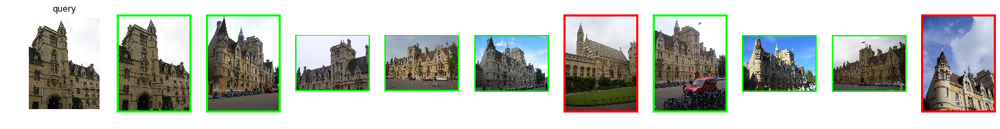

In [22]:
dataset.vis_top(dfeats, q_idx, ap_flag=True)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.034s...
[t-SNE] Computed neighbors for 5063 samples in 11.035s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.135077
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.966179
[t-SNE] KL divergence after 300 iterations: 2.426583
t-SNE done! Time elapsed: 28.577 seconds


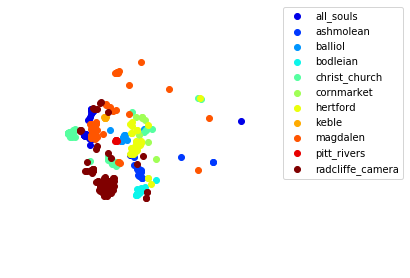

2-dimensional t-sne plot.


In [23]:
do_tsne(dfeats, labels, classes, sec='1c')

**Question 10**: How does the aggregation layer changes the t-SNE visualization? 
    
**Question 11**: Can we see some structure in the clusters of similarly labeled images?

## d) ResNet18 architecture with GeM pooling

Now, we will replace the base architecture of our network (the backbone) with a ResNet18 architecture.

In [24]:
model_0 = resnet18()      # instantiate one model with average pooling and another 
model_1d = resnet18_GeM() # with GeM pooling with the same ResNet18 architecture

print(model_0.adpool)     # Show how the last layers of the two models are different
print(model_1d.adpool)

AvgPool2d(kernel_size=7, stride=1, padding=0)
GeneralizedMeanPooling(3, output_size=1)


**Question 12**: Why do we change the average pooling layer of the original Resnet18 architecture for a generalized mean pooling? 

**Question 13**: What operation is the layer model_1d.adpool doing?
 * _Hint: You can see the code of the generalized mean pooling in file modules.py_

Now let's do the same as before and visualize the features and top-15 most similar images to our query:

Let's use a different image for testing this time:

In [25]:
q_idx = 41

Now, let's load Oxford features from ResNet18 model and visualize the top-15 results for the given query index

AP=11.38


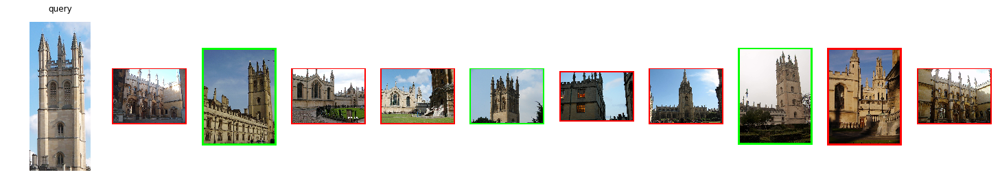

In [26]:
dfeats = np.load(models_dict['resnet18-cls-lm-gem']['dataset'])
qfeats = np.load(models_dict['resnet18-cls-lm-gem']['queries'])
dataset.vis_top(dfeats, q_idx, q_feat=qfeats[q_idx], ap_flag=True)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.036s...
[t-SNE] Computed neighbors for 5063 samples in 10.567s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.103304
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.222145
[t-SNE] KL divergence after 300 iterations: 2.359371
t-SNE done! Time elapsed: 27.552 seconds


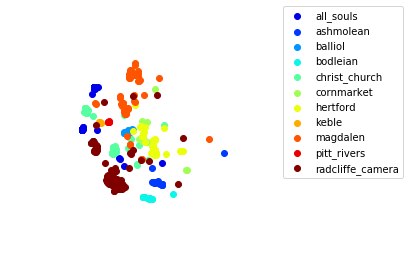

2-dimensional t-sne plot.


In [27]:
do_tsne(dfeats, labels, classes, sec='1d')

**Question 14**: How does this model compare with model 1c, that was trained in the same dataset for the same task?

**Question 15**: How does is compare to the finetuned models of 1b?

## e) PCA Whitening

Now we will investigate the effects of whitening our descriptors and queries. We will not be changing anything in the network.

AP=19.37


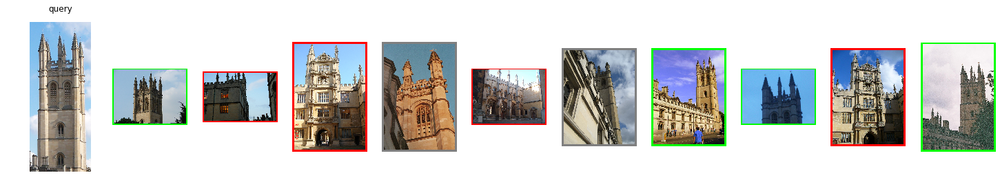

In [28]:
# We use a PCA learnt on landmarks to whiten the output features of 'resnet18-cls-lm-gem'
dfeats = np.load(models_dict['resnet18-cls-lm-gem-pcaw']['dataset'])
qfeats = np.load(models_dict['resnet18-cls-lm-gem-pcaw']['queries'])
dataset.vis_top(dfeats, q_idx, q_feat=qfeats[q_idx], ap_flag=True)

Visualize the data with t-SNE (excluding unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.033s...
[t-SNE] Computed neighbors for 5063 samples in 11.236s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.250935
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.496727
[t-SNE] KL divergence after 300 iterations: 2.907229
t-SNE done! Time elapsed: 29.632 seconds


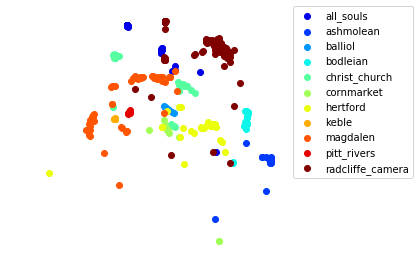

2-dimensional t-sne plot.


In [29]:
do_tsne(dfeats, labels, classes, sec='1e-1')

Visualize the data with t-SNE (including unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.054s...
[t-SNE] Computed neighbors for 5063 samples in 10.763s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.250952
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.511063
[t-SNE] KL divergence after 300 iterations: 2.915803
t-SNE done! Time elapsed: 22.773 seconds


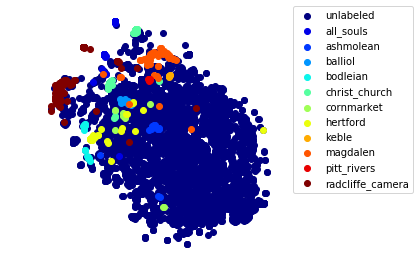

2-dimensional t-sne plot.


In [30]:
do_tsne(dfeats, labels, classes, sec='1e-2', show_unlabeled=True)

**Question 16**: What can we say about the separation of data when included unlabeled images?

**Question 17**: And the distribution of the unlabeled features?

**Question 18**: How can we train a model to separate labeled from unlabeled data?

## f) Finetuning on Landmarks for retrieval

Now we learn the architecture presented in item e) in an end-to-end manner for the retrieval task. The architecture includes a FC layer that replaces the PCA projection.

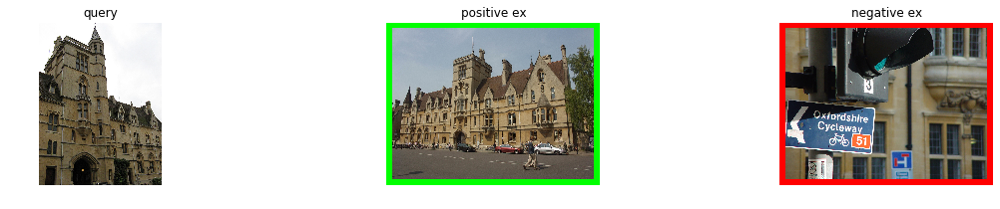

Triplet for landmark balliol.


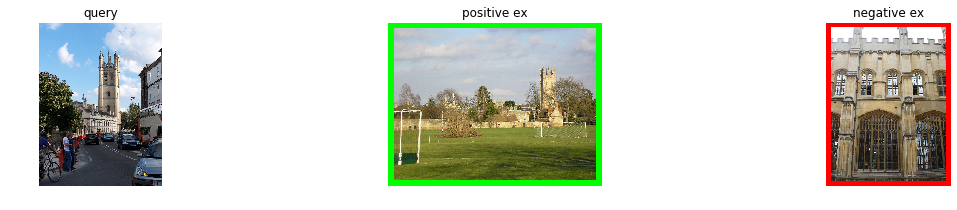

Triplet for landmark magdalen.


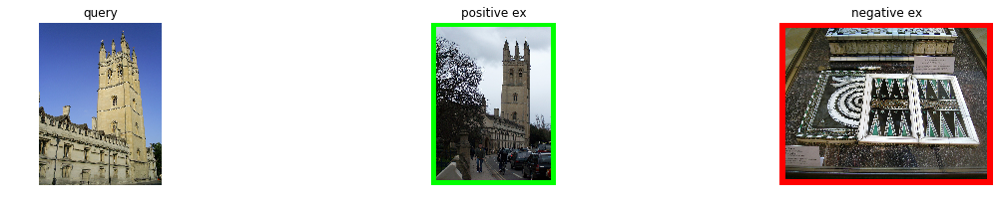

Triplet for landmark magdalen.


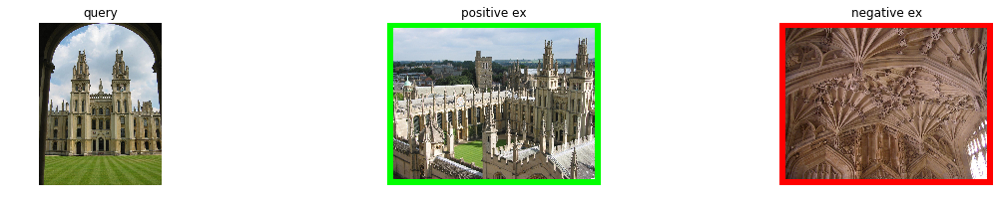

Triplet for landmark all_souls.


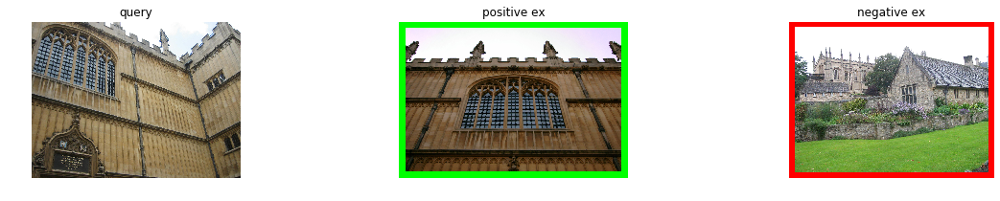

Triplet for landmark bodleian.


In [31]:
dataset.vis_triplets(nplots=5) 
# will print 5 examples of triplets (tuples with a query, a positive, and a negative)

Now, let's visualize the top results as before:

AP=55.24


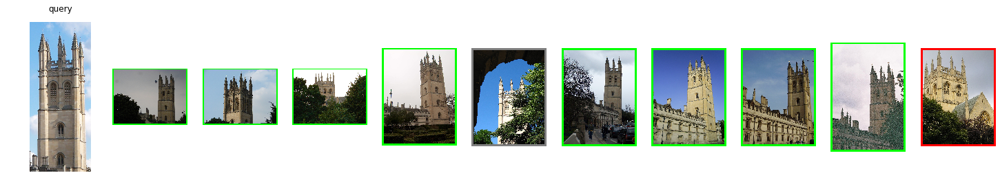

In [32]:
# load Oxford features from ResNet18 model trained with triplet loss
dfeats = np.load(models_dict['resnet18-rnk-lm-gem']['dataset'])
qfeats = np.load(models_dict['resnet18-rnk-lm-gem']['queries'])
dataset.vis_top(dfeats, q_idx, q_feat=qfeats[q_idx], ap_flag=True)

Visualize the data with t-SNE (excluding unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.033s...
[t-SNE] Computed neighbors for 5063 samples in 11.452s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.262229
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.931740
[t-SNE] KL divergence after 300 iterations: 2.449680
t-SNE done! Time elapsed: 24.039 seconds


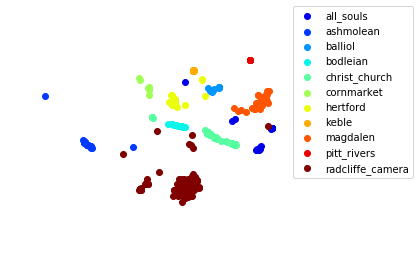

2-dimensional t-sne plot.


In [33]:
do_tsne(dfeats, labels, classes, sec='1f-1')

Visualize the data with t-SNE (including unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.051s...
[t-SNE] Computed neighbors for 5063 samples in 11.016s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.262246
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.928589
[t-SNE] KL divergence after 300 iterations: 2.448281
t-SNE done! Time elapsed: 29.896 seconds


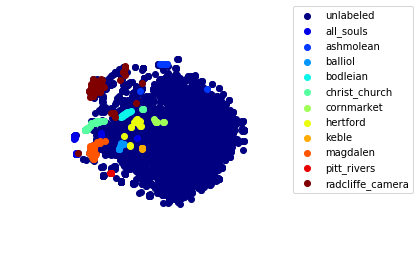

2-dimensional t-sne plot.


In [34]:
do_tsne(dfeats, labels, classes, sec='1f-1', show_unlabeled=True)

**Question 19**: Compare the plots with unlabeled data of the model trained for retrieval (with triplet loss) and the model trained for classification of the previous subsection. How do they change?

## g) Data augmentation and multi-resolution

Let's now check the effects of adding data augmentation techniques to the training. We will now compare models that have been trained with and without data augmentation.

We will load features that have been trained with the following data augmentation: cropping, pixel jittering, rotation, and tilting. This means that this model has been trained with the original image and its transformed versions. Please note that not all transformations might be useful for every class or image, but it is impossible to know in advance how the pictures were taken and the characteristics of each individual class _a priori_.

For example, cropping is useful when the landmark of interest is usually not found at the center of the image (e.g. selfies taken in front of the tour Eiffel).

Another standard practice besides data augmentation is to consider different variations of the same picture but at different resolutions. There are multiple ways to combine features extracted from those images, such as average pooling or spatial pyramids.

Using a model trained with data augmentation, we now extract features at 4 different resolutions and average the outputs.

Let's visualize the top results just like before:

AP=58.36


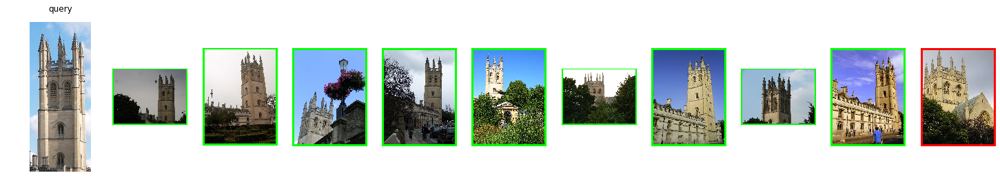

In [35]:
dfeats = np.load(models_dict['resnet18-rnk-lm-gem-da-mr']['dataset'])
qfeats = np.load(models_dict['resnet18-rnk-lm-gem-da-mr']['queries'])
dataset.vis_top(dfeats, q_idx, q_feat=qfeats[q_idx], ap_flag=True)

Visualize the data with t-SNE (excluding unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.032s...
[t-SNE] Computed neighbors for 5063 samples in 9.841s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.223889
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.493790
[t-SNE] KL divergence after 300 iterations: 2.362153
t-SNE done! Time elapsed: 28.164 seconds


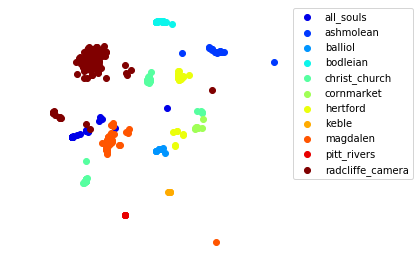

2-dimensional t-sne plot.


In [36]:
do_tsne(dfeats, labels, classes, sec='1g')

**Question 20**: What is the difference in AP between a model that has trained with and without data augmentation?

**Question 21**: What about the clustering? Why do you believe some of the classes have not been adequately clustered yet?

**Question 22**: What other data augmentation or pooling techniques would you suggest to improve results? Why?

# h) Improved architecture

Finally, we will now upgrade the backbone architecture to Resnet50.

AP=64.59


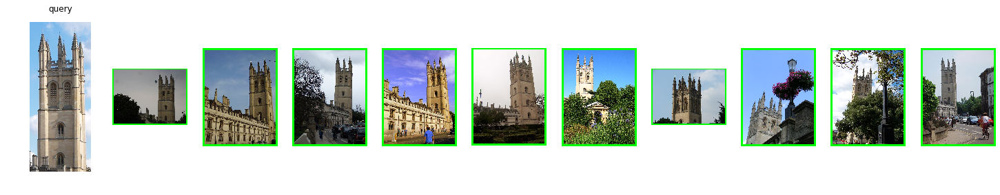

In [37]:
dfeats = np.load(models_dict['resnet50-rnk-lm-gem-da-mr']['dataset'])
qfeats = np.load(models_dict['resnet50-rnk-lm-gem-da-mr']['queries'])
dataset.vis_top(dfeats, q_idx, q_feat=qfeats[q_idx], ap_flag=True)

Visualize the data with t-SNE (excluding unlabeled images)

applying PCA...
applying t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5063 samples in 0.032s...
[t-SNE] Computed neighbors for 5063 samples in 10.604s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5063
[t-SNE] Computed conditional probabilities for sample 2000 / 5063
[t-SNE] Computed conditional probabilities for sample 3000 / 5063
[t-SNE] Computed conditional probabilities for sample 4000 / 5063
[t-SNE] Computed conditional probabilities for sample 5000 / 5063
[t-SNE] Computed conditional probabilities for sample 5063 / 5063
[t-SNE] Mean sigma: 0.246012
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.284798
[t-SNE] KL divergence after 300 iterations: 2.269293
t-SNE done! Time elapsed: 30.854 seconds


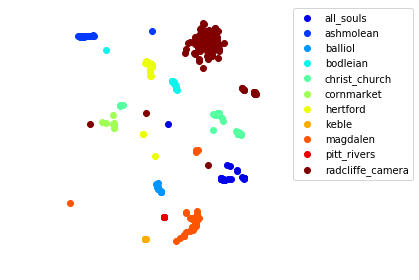

2-dimensional t-sne plot.


In [38]:
do_tsne(dfeats, labels, classes, sec='1h')

**Question 24**: Why using a larger architecture results in a higher AP? Is this always going to be the case?